In [1]:
import cv2
import glob
import numpy as np
from math import *
import matplotlib.pyplot as plt
import matplotlib.image as mplimg
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

import collections
from itertools import chain, repeat
from functools import reduce


%matplotlib inline

### Step 1:  Camera Calibration

The first step in the pipeline is camera caliberation. I used OpenCV ```findChessboardCorners``` function to find the corners and append them to image-points which represents the 2D points in the image. I also prepared simultaneiusly object points (x,y,z) which represent the 3D coordinatres of the chessboard corners in the world. To do this I assumed that the chessboard is fixed on an (x,y) plane at z=0, s.t. the object points for all caliberation images are same.

I then used the object points and image points returned by the camera_caliberation function to compute the camera calibration and distortion coefficients with the help of OpenCV's ```calibrateCamera``` function. 

In [2]:
## Caliberate the Camera using caliberation images and then use them to get
# Camera Intrinsic and Extrinsic features which can be used to undistort an image
def calibrate_camera(cal_images, nx, ny, display=False):
    objpoints = []  # 3D points
    imgpoints = []  # 2D points

    objp = np.zeros((nx*ny,3), np.float32)
    objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1, 2)

    fname = cal_images[0]
    for fname in cal_images:
        image_name = fname.split('/', 1 )[1]
        image_name = image_name.split('.', 1 )[0]
        
        img = mplimg.imread(fname)
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

        ret, corners = cv2.findChessboardCorners(gray, (nx, ny), None)
        if ret == True:
            objpoints.append(objp)
            imgpoints.append(corners)
            
        if ret & display:
            # Display the corners
            cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
            f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
            axis1.imshow(cv2.cvtColor(mplimg.imread(fname), cv2.COLOR_BGR2RGB))
            axis1.set_title("Image: "+ image_name, fontsize=18)
            axis2.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
            axis2.set_title("Image with Corners: "+image_name, fontsize=18)
            plt.savefig("output_images/camera_cal_output"+"/"+image_name+"_out.jpg")

    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)
    
    return mtx, dist

def camera_setup(display=False):
    cal_images = glob.glob("camera_cal/calibration*.jpg")
    nx, ny = 9, 6
    cam_mtx, cam_dist = calibrate_camera(cal_images, nx, ny, display)
    return cam_mtx, cam_dist

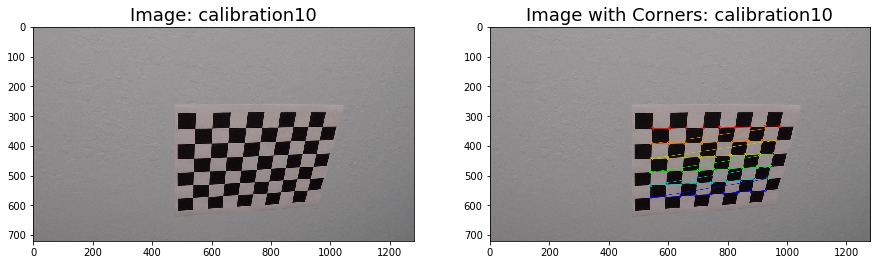

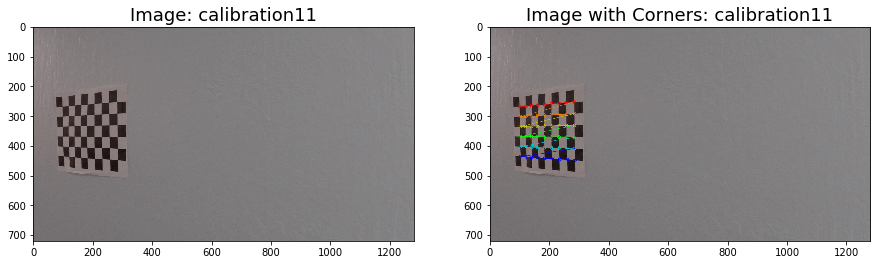

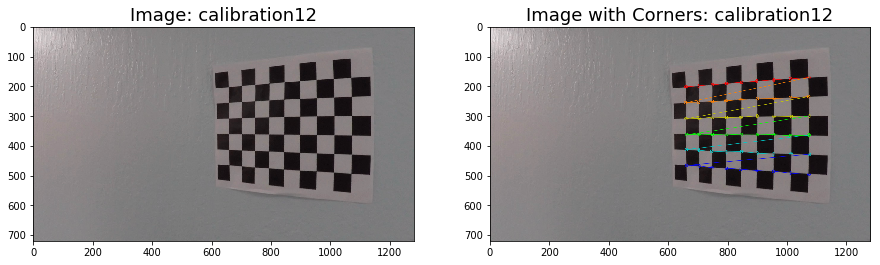

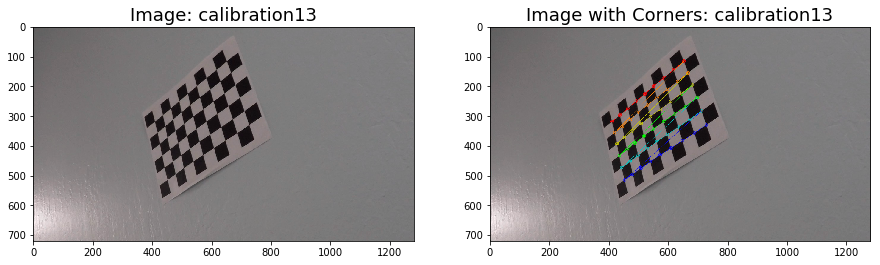

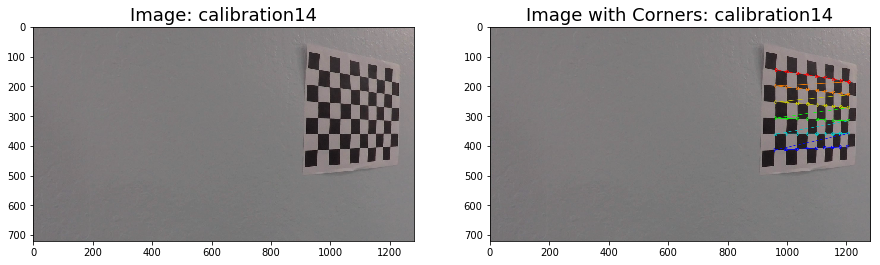

...

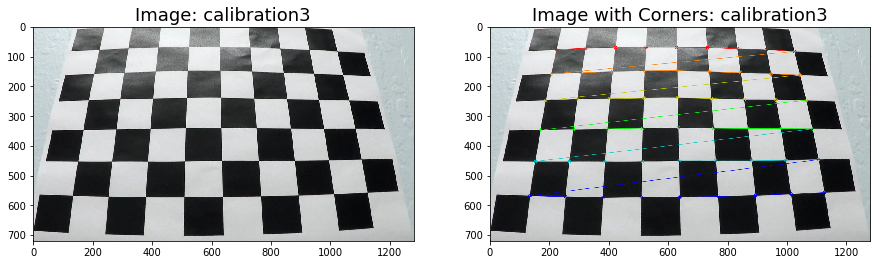

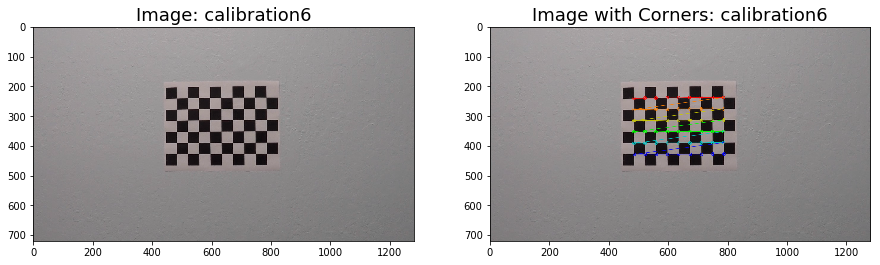

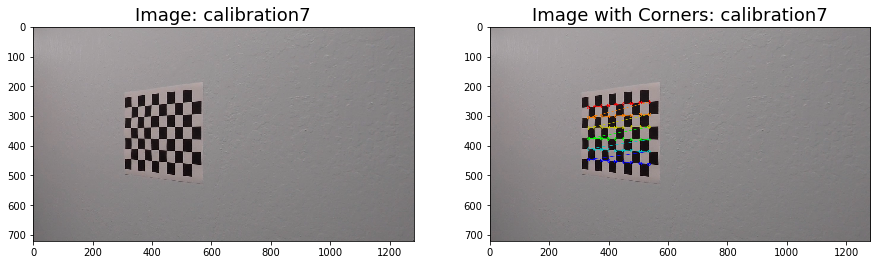

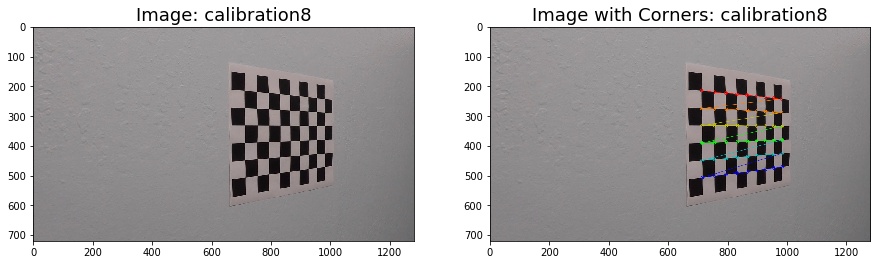

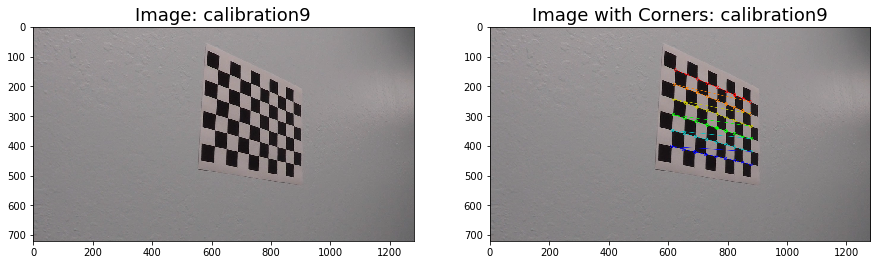

In [3]:
## Use the functions above to find Camera features and plotting the calibrtion images
cam_mtx, cam_dist = camera_setup(display = True)

### Step 2 : Apply a distortion correction to raw images.

 The distortion coefficients and camera matrix are used to undistort the image.

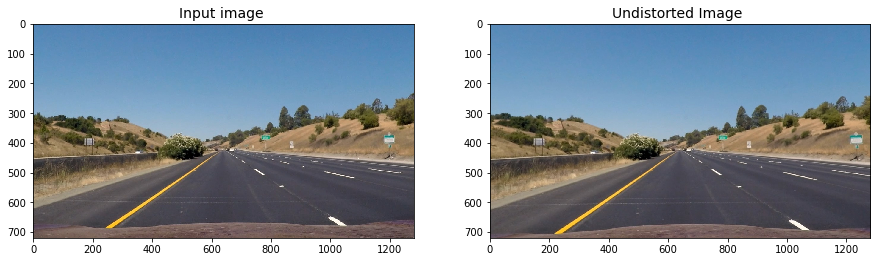

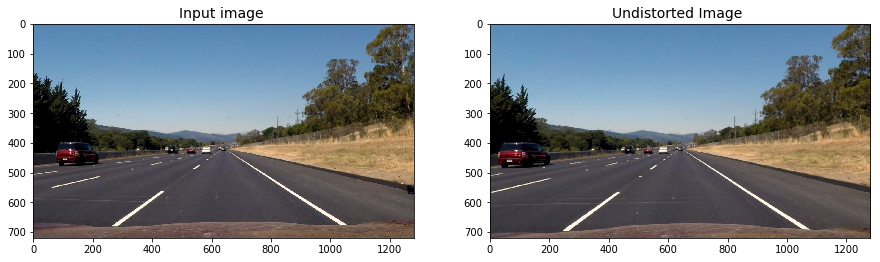

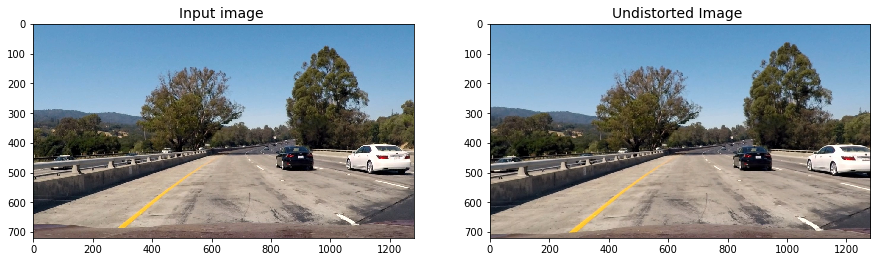

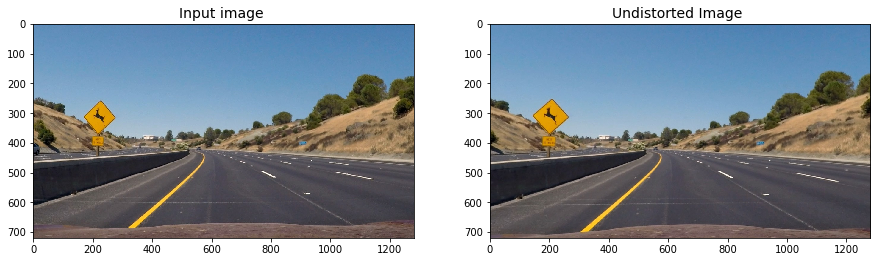

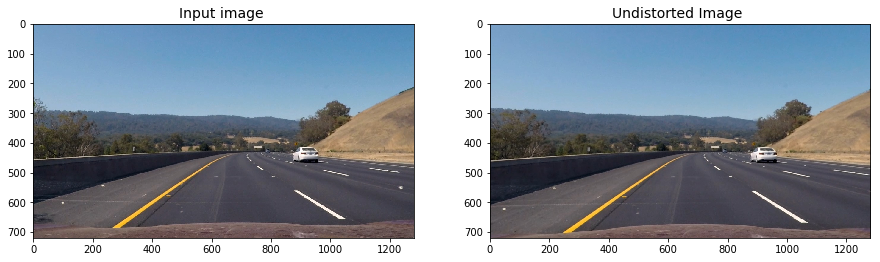

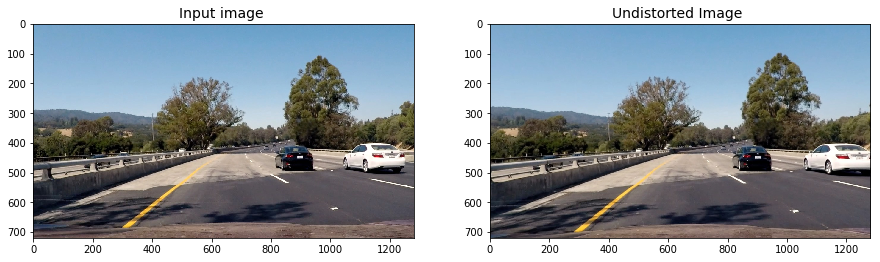

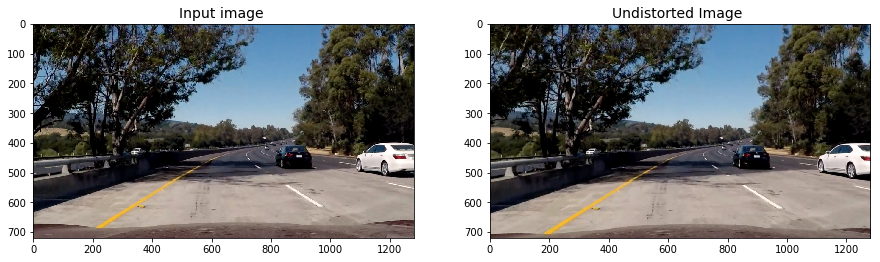

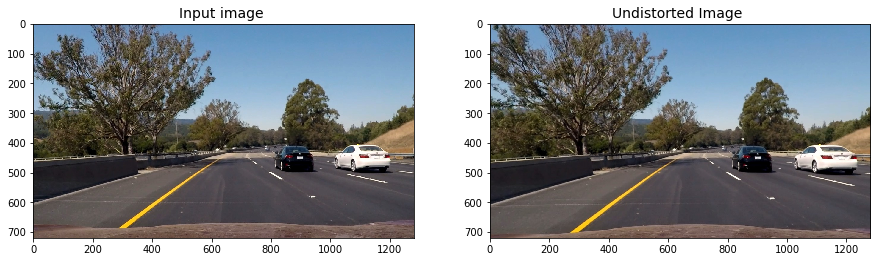

In [4]:
# Remove distortion from images
def undistort(img,mtx=cam_mtx, dist=cam_dist, display=False, read = False):
    if read:
        img = mplimg.imread(img)
        
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    if display:
        f, (axis1, axis2) = plt.subplots(1, 2, figsize=(15,10))
        axis1.imshow(img) #cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axis1.set_title("Input image ", fontsize=14)
        axis2.imshow(undist)#cv2.cvtColor(undist, cv2.COLOR_BGR2RGB))
        axis2.set_title("Undistorted Image ", fontsize=14)
        
    return undist
    
    
test_images = 'test_images/*.jpg'    
test_images_list = glob.glob(test_images)
for image in test_images_list:
    undistort(image, display=True, read=True)  

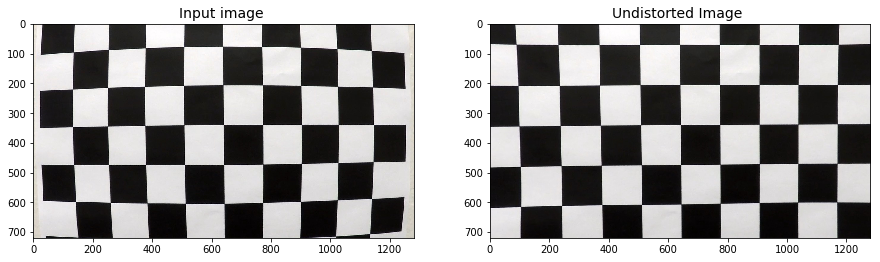

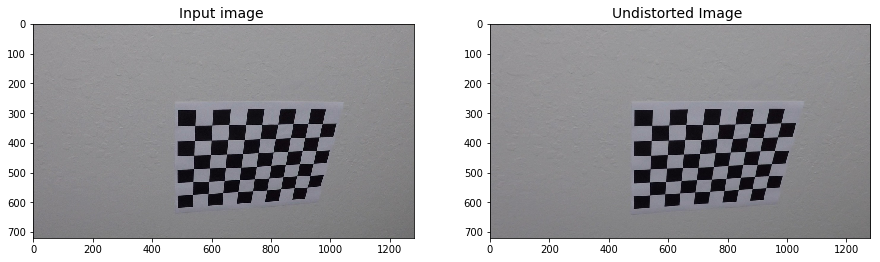

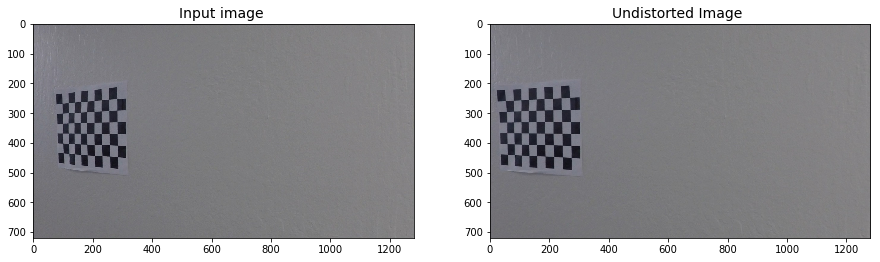

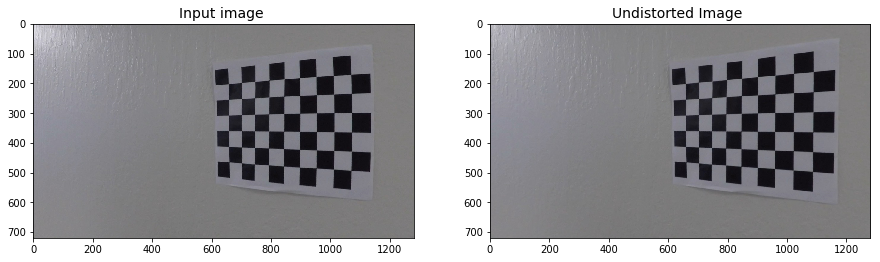

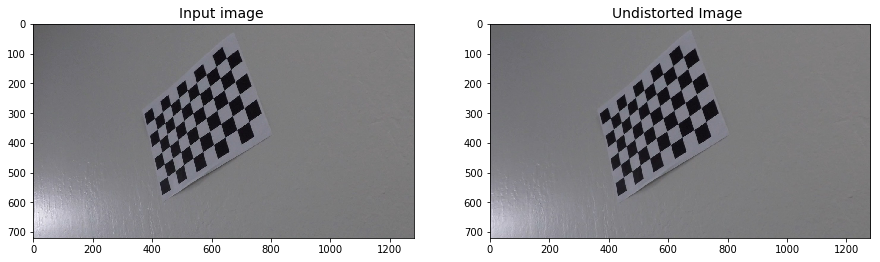

...

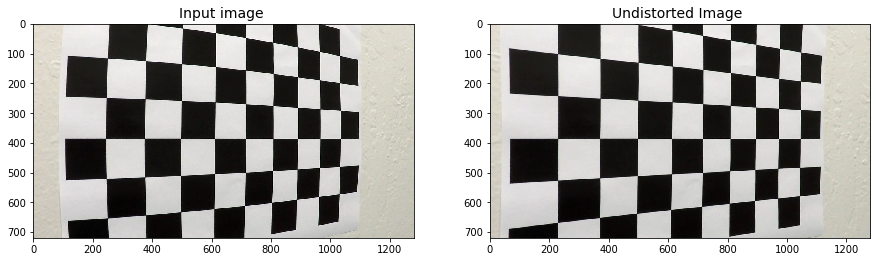

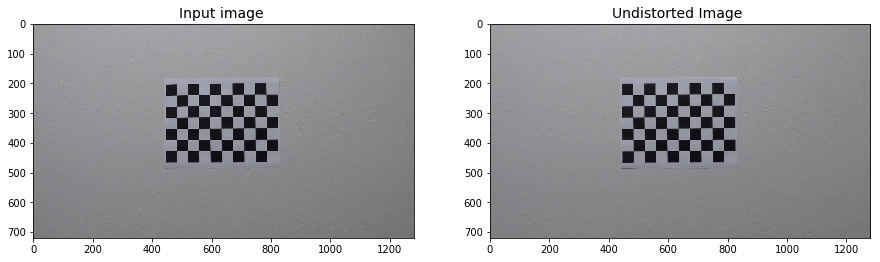

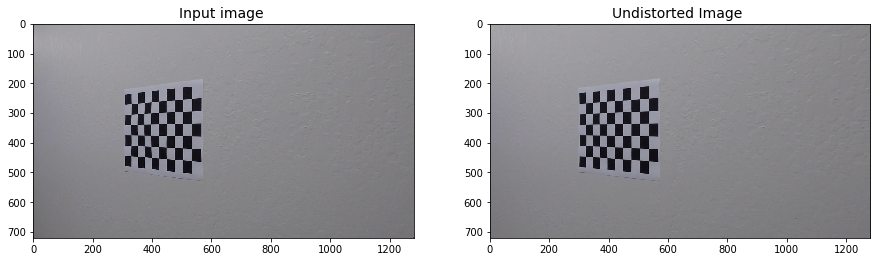

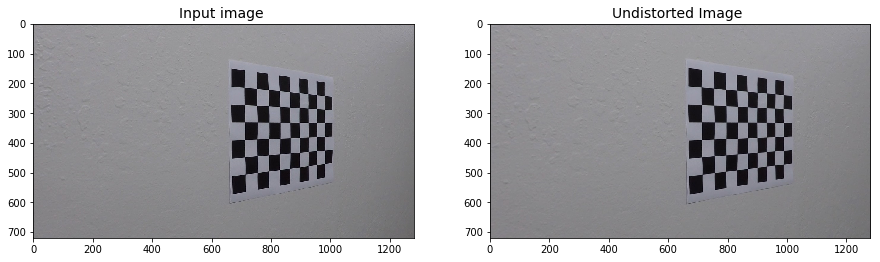

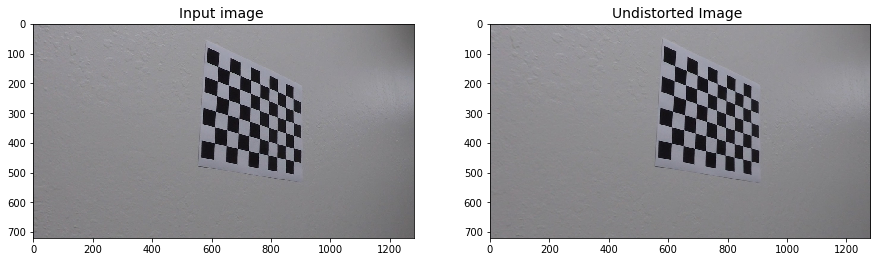

In [5]:
# Let us try undistort on calibration images to be sure
test_images = "camera_cal/calibration*.jpg"    
test_images_list = glob.glob(test_images)
for image in test_images_list:
    undistort(image, display=True, read=True)  

### Step 3: Use color transforms, gradients, etc., to create a thresholded binary image. _ to change


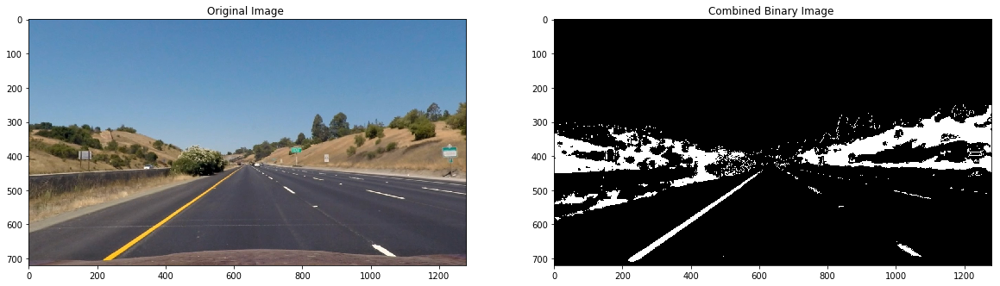

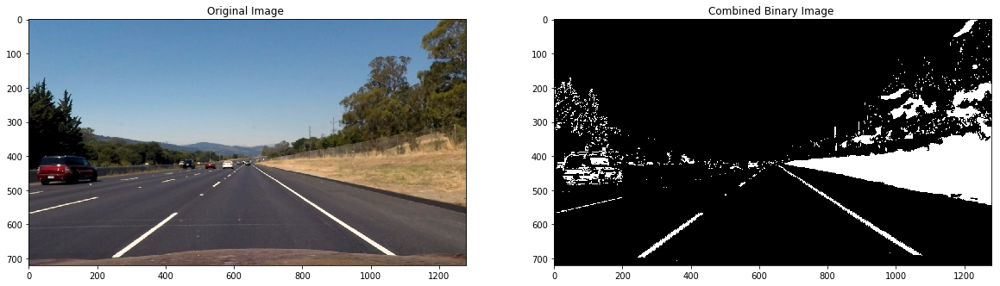

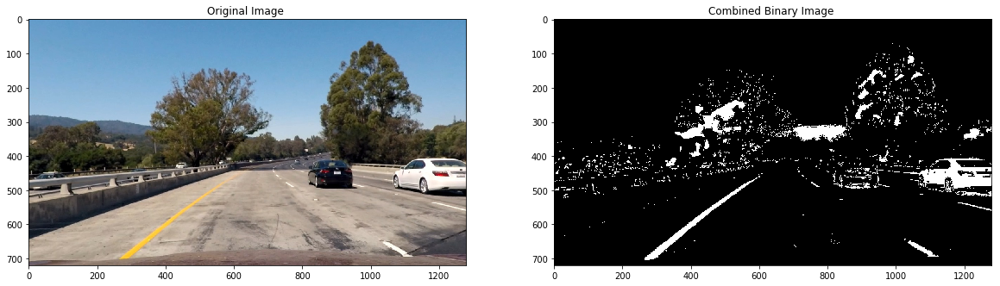

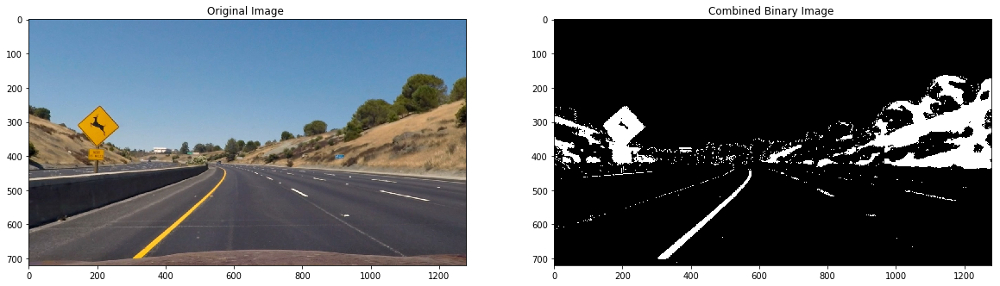

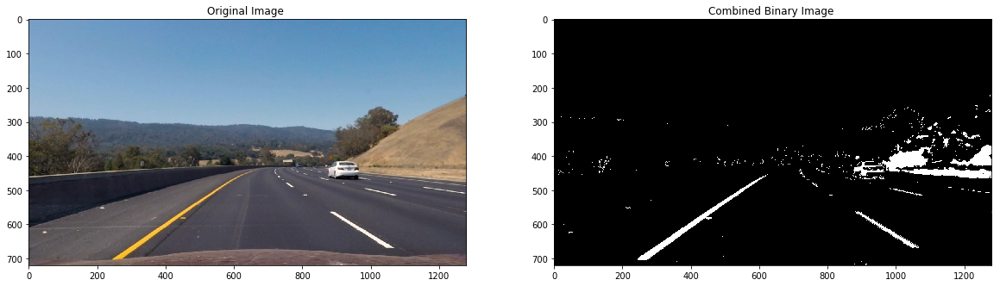

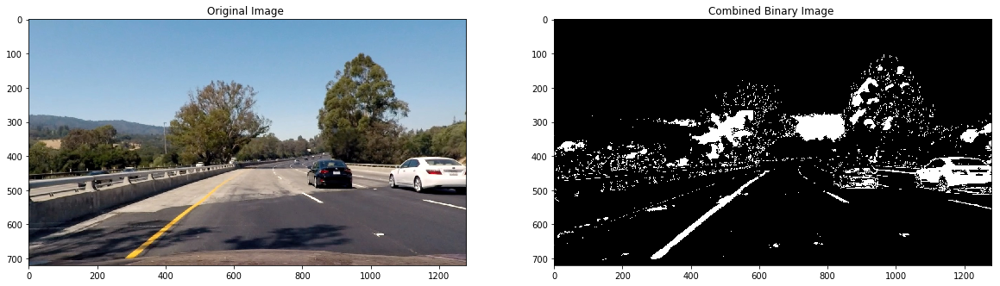

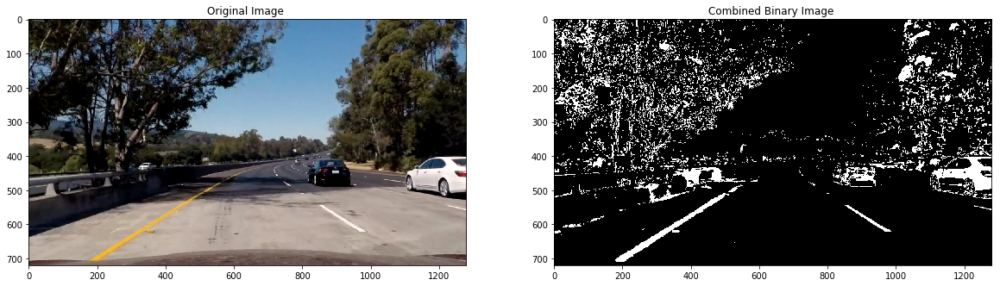

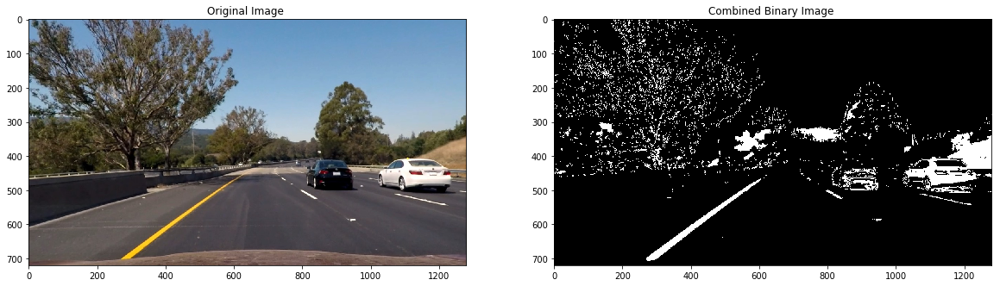

In [6]:
# Convert to HLS color space and separate the S channel

def binary_image_transform(img, display = False, read = False):
    # img is the distorted image
    
    if read:
        img = undistort(img, display = False, read = True)
    else:
        img = undistort(img, display = False, read = False) 
    
    #print(img)
    s_channel = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)[:,:,2]
    l_channel = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)[:,:,0]
    b_channel = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)[:,:,2]   


    
    # Grayscale image
    # NOTE: we already saw that standard grayscaling lost color information for the lane lines
    # Explore gradients in other colors spaces / color channels to see what might work better
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    thresh_min = 50
    thresh_max = 100
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1

    # Threshold s-color channel HLS color space
    s_thresh_min = 180
    s_thresh_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh_min) & (s_channel <= s_thresh_max)] = 1
    
    # Threshold l-color channel LUV color space
    l_thresh_min = 210
    l_thresh_max = 255
    l_binary = np.zeros_like(l_channel)
    l_binary[(l_channel >= l_thresh_min) & (l_channel <= l_thresh_max)] = 1
    
    # Threshold b-color channel LAB color space
    b_thresh_min = 150
    b_thresh_max = 200
    b_binary = np.zeros_like(b_channel)
    b_binary[(b_channel >= b_thresh_min) & (b_channel <= b_thresh_max)] = 1

    
    # Combine the two binary thresholds
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(s_binary == 1) | (sxbinary == 1)| (l_binary == 1)| (b_binary == 1)] = 1
    #combined_binary[ (sxbinary == 1)|(l_binary == 1)| (b_binary == 1)] = 1
    
    if display:
        # Plotting thresholded images
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title("Original Image ")
        ax1.imshow(img) #cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        
        ax2.set_title("Combined Binary Image ")
        ax2.imshow(combined_binary, cmap='gray')
    
    return combined_binary

test_images = 'test_images/*.jpg' 
test_images_list = glob.glob(test_images)
for image in test_images_list:
    binary_image_transform(image, display= True, read=True)

### Step 4: Apply a perspective transform to rectify binary image ("birds-eye view").

In [7]:
# Define a function to find the perspective points automatically
def find_perspective_points(image):
    binary = binary_image_transform(image, read=False)
    
    # Computing perspective points automatically
    rho = 2              # distance resolution in pixels of the Hough grid
    theta = 1*np.pi/180  # angular resolution in radians of the Hough grid
    threshold = 80       # minimum number of votes (intersections in Hough grid cell)
    min_line_length = 100 # minimum number of pixels making up a line
    max_line_gap = 20    # maximum gap in pixels between connectable line segments

    angle_min_mag = 20*pi/180
    angle_max_mag = 65*pi/180

    lane_markers_x = [[], []]
    lane_markers_y = [[], []]
    
    masked_edges = np.copy(binary)
    masked_edges[:binary.shape[0]*6//10,:] = 0
    lines = cv2.HoughLinesP(masked_edges, rho, theta, threshold, min_line_length, max_line_gap)
    #print(len(lines))
    
    try:
        for line in lines:
            for x1,y1,x2,y2 in line:
                theta = atan2(y1-y2, x2-x1)
                #rho = ((x1+x2)*cos(theta) + (y1+y2)*sin(theta))/2
                if (abs(theta) >= angle_min_mag and abs(theta) <= angle_max_mag):
                    if theta > 0: # positive theta is downward in image space?
                        i = 0 # Left lane marker
                    else:
                        i = 1 # Right lane marker
                    lane_markers_x[i].append(x1)
                    lane_markers_x[i].append(x2)
                    lane_markers_y[i].append(y1)
                    lane_markers_y[i].append(y2)
    except:
        #print("none found")
        return None

    if len(lane_markers_x[0]) < 1 or len(lane_markers_x[1]) < 1:
        # Failed to find two lane markers
        return None
    
    # Fit a left and right line 
    p_left  = np.polyfit(lane_markers_y[0], lane_markers_x[0], 1)
    p_right = np.polyfit(lane_markers_y[1], lane_markers_x[1], 1)
    
    # Find intersection of the two lines
    apex = np.linalg.solve([[p_left[0], -1], [p_right[0], -1]], [-p_left[1], -p_right[1]])
    top_y = ceil(apex[0] + 0.075*binary.shape[0])
    
    bl = ceil(np.polyval(p_left, binary.shape[0]))
    tl = ceil(np.polyval(p_left, top_y))
    
    br = ceil(np.polyval(p_right, binary.shape[0]))
    tr = ceil(np.polyval(p_right, top_y))

    src = np.array([[tl, top_y],[tr, top_y],
        [br, binary.shape[0]],[bl, binary.shape[0]]], np.float32)

    return src


# calculate the perspective 

def get_perspective_transform(image, src_in = None, display=False):
    img_size = image.shape
    if src_in is None:
        src = np.array([[580. /1280.*img_size[1], 455./720.*img_size[0]],
                        [700. /1280.*img_size[1], 455./720.*img_size[0]],
                        [1130./1280.*img_size[1], 720./720.*img_size[0]],
                        [190. /1280.*img_size[1], 720./720.*img_size[0]]], np.float32)
    else:
        src = src_in
        
    dst = np.array([[300. /1280.*img_size[1], 100./720.*img_size[0]],
                        [1000./1280.*img_size[1], 100./720.*img_size[0]],
                        [1000./1280.*img_size[1], 720./720.*img_size[0]],
                        [300. /1280.*img_size[1], 720./720.*img_size[0]]], np.float32)
    
        
    warp_m = cv2.getPerspectiveTransform(src, dst)
    warp_minv = cv2.getPerspectiveTransform(dst, src)

    if display:
        
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.set_title("Original image with source points ", fontsize=18)
        ax1.hold(True)
        ax1.imshow(image)
        colors = ['r+','g+','b+','k+']
        for i in range(4):
            ax1.plot(src[i,0],src[i,1],colors[i],mew=2,ms=10)
            
            
        
        im2 = cv2.warpPerspective(image, warp_m, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
        ax2.set_title("Warped image with destination points", fontsize=18)
        ax2.imshow(im2, cmap='gray')
        ax2.hold(True)
        colors = ['r+','g+','b+','k+']
        for i in range(4):
            ax2.plot(dst[i,0],dst[i,1],colors[i],mew=2,ms=10)
        
        plt.show()
    return warp_m, warp_minv

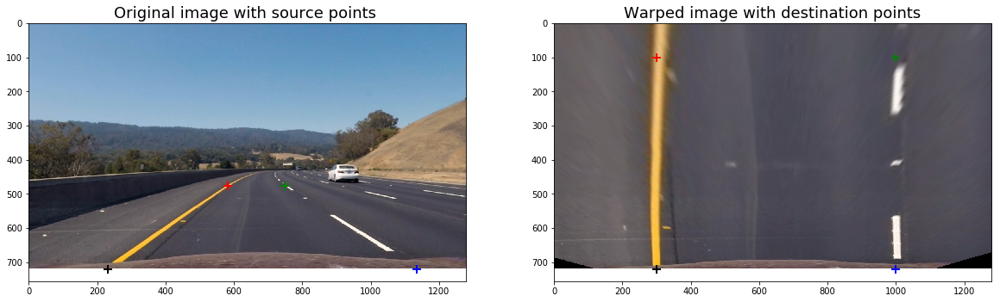

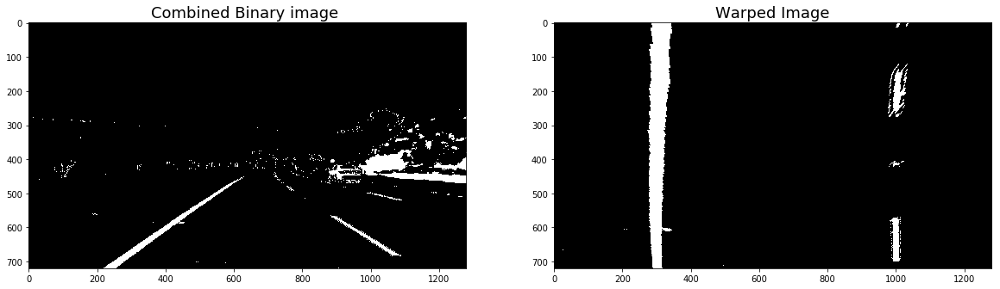

In [8]:
image = mplimg.imread('test_images/test3.jpg')

undist = cv2.undistort(image, cam_mtx, cam_dist, None, cam_mtx)

yellow = (np.array([160, 128, 0]), np.array([255, 255, 128]))
hls = cv2.cvtColor(undist, cv2.COLOR_RGB2HLS)

src = find_perspective_points(undist)
warp_m, warp_minv = get_perspective_transform(undist, src_in=src, display=True)

binary = binary_image_transform(undist)
lanes = cv2.warpPerspective(binary, warp_m, (undist.shape[1], undist.shape[0]), flags=cv2.INTER_LINEAR)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.set_title("Combined Binary image ", fontsize=18)
ax1.imshow(binary, cmap='gray')
    
        
        
ax2.set_title("Warped Image", fontsize=18)
ax2.imshow(lanes, cmap='gray')



In [9]:
# Define a class to receive the characteristics of each line detection
import collections
from itertools import chain, repeat
from functools import reduce

ym_per_pix = 30/720 # meters per pixel in y dimension
xm_per_pix = 3.7/700 # meteres per pixel in x dimension

class Line():
    def __init__(self, base_pt, img_size, memory_length):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = collections.deque(maxlen=memory_length)
        self.recent_yfitted = collections.deque(maxlen=memory_length)
        
        #average x values of the fitted line over the last n iterations
        self.bestx = None   
        
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = 0.0 
                
        self.current_xfit = None
        #self.roi_mask = None
        
        self.img_size = img_size
        self.base_pt = base_pt
        
        self.yvals = np.linspace(0, img_size[0], 101)
        self.mask = np.ones(img_size, dtype=np.uint8)*255
        
        self.dropped_frames = 0
    
    def add_lane_pixels(self, x, y):
        # Use all pixels from previous detections for curve fit
        weights = np.ones(len(self.recent_xfitted))
        if len(weights) > 1:
            weights[0] = 0.8
            weights[1:] = 0.2/(len(weights) - 1)

            w_x = reduce(lambda a,b: a + b[0]*b[1], zip(weights, self.recent_xfitted), np.zeros(len(self.yvals)))
            w_y = reduce(lambda a,b: a + b[0]*b[1], zip(weights, self.recent_yfitted), np.zeros(len(self.yvals)))
        else:
            w_x, w_y = [], []
        x_hist = np.fromiter(chain(w_x, x), np.int32)
        y_hist = np.fromiter(chain(w_y, y), np.int32)

        try:
            p_lane = np.polyfit(y_hist, x_hist, 2)
            rad_curv = self.compute_rad_curv(x_hist, y_hist)
            self.detected = self.sanity_check_lane(rad_curv)
        except Exception as e:
            print(e)
            self.detected = False

        if self.detected and len(p_lane) == 3:
            x_fit = p_lane[0]*self.yvals**2 + p_lane[1]*self.yvals + p_lane[2]

            self.current_xfit = x_fit   # For drawing

            self.recent_xfitted.append(x_fit)
            self.recent_yfitted.append(self.yvals)

            self.radius_of_curvature = rad_curv
            self.current_fit = p_lane
            self.dropped_frames = 0
        else:
            # Sanity check failed
            # Use last fit if current one failed
            p_lane = self.current_fit
            rad_curv = self.radius_of_curvature
            x_fit = p_lane[0]*self.yvals**2 + p_lane[1]*self.yvals + p_lane[2]
            self.dropped_frames += 1

        # Update ROI mask
        self.mask.fill(0)
        pts = np.transpose(np.vstack([x_fit, self.yvals])).reshape((-1,1,2)).astype(np.int32)
        cv2.drawContours(self.mask, pts, -1, (255,255,255), thickness=80)
        
    @staticmethod
    def compute_rad_curv(xvals, yvals):
        # Calculate yhe radius of curvature
        fit_cr = np.polyfit(yvals*ym_per_pix, xvals*xm_per_pix, 2)
        y_eval = np.max(yvals)
        curverad = ((1 + (2*fit_cr[0]*y_eval*ym_per_pix + fit_cr[1])**2)**1.5) \
                                     /np.absolute(2*fit_cr[0])
        return curverad
        
        
    def sanity_check_lane(self, R):
        """
        Checks new radius of curvature `R` against the radius stored in the object.
        """
        # Return true if there is no prior data
        if self.radius_of_curvature is None:
            return True
                
        R0 = self.radius_of_curvature
        self.line_base_pos = abs(R-R0)/R0
        return self.line_base_pos <= 0.5  # Max change from frame to frame is 200%
            
        
    def detect_from_mask(self, image):
        # Useful if lane has already been detected
        mask_lanes = cv2.bitwise_and(image, self.mask)
        all_pts = cv2.findNonZero(mask_lanes)
        if all_pts is not None:
            all_pts = all_pts.reshape((-1,2))
            self.add_lane_pixels(all_pts[:,0], all_pts[:,1])
        else:
            self.detected = False
        
    def draw_lane(self, image):
        """
        Draws lane on given image
        """
        pts = np.array([np.transpose(np.vstack([self.current_xfit, self.yvals]))])
        cv2.fillPoly(image, np.int_([pts]), (0,255, 0))
        return image
    
def reject_outliers(x_list, y_list):
    if not x_list or not y_list:
        return x_list, y_list
    mu_x, mu_y = np.mean(x_list), np.mean(y_list)
    sig_x, sig_y = np.std(x_list), np.std(y_list)
    new_x, new_y = zip(*[(x, y) for (x,y) in zip(x_list, y_list) 
                                 if abs(x - mu_x) < 2*sig_x and abs(y - mu_y) < 2*sig_y])
    return new_x, new_y

def histogram_lane_detection(image, left_lane, right_lane, base_pts, num_windows = 10, window_width = 0.2):
    """Uses histogram and sliding window to detect lanes from scratch"""

    height = image.shape[0]
    sWindow_height = int(1./num_windows * height)   # Divide image into horizontal bands
    sWindow_width = int(window_width*image.shape[1])
    
    l_x, l_y, r_x, r_y = [], [], [], []
    
    base_left, base_right = base_pts

    idx_left, idx_right = base_pts
    for i in reversed(range(num_windows)):
        w_left = image[i*sWindow_height:(i+1)*sWindow_height,base_left-sWindow_width//2:base_left+sWindow_width//2]
        w_right = image[i*sWindow_height:(i+1)*sWindow_height,base_right-sWindow_width//2:base_right+sWindow_width//2]
        
        left_y_pt, left_x_pt = np.nonzero(w_left)
        right_y_pt, right_x_pt = np.nonzero(w_right)
        
        l_x.extend(left_x_pt + base_left-sWindow_width//2)
        l_y.extend(left_y_pt + i*sWindow_height)
        r_x.extend(right_x_pt+ base_right-sWindow_width//2)
        r_y.extend(right_y_pt+ i*sWindow_height)

        # Find 'x' with maximum nonzero elements as baseline for next window
        s_left = np.sum(w_left, axis=0)
        s_right = np.sum(w_right, axis=0)
        if np.any(s_left > 0):
            base_left = np.argmax(s_left) + base_left-sWindow_width//2
        if np.any(s_right > 0):
            base_right = np.argmax(s_right) + base_right-sWindow_width//2

    l_x, l_y = reject_outliers(l_x, l_y)
    r_x, r_y = reject_outliers(r_x, r_y)
    
    left_lane.add_lane_pixels(l_x, l_y)
    right_lane.add_lane_pixels(r_x, r_y)

    return left_lane, right_lane

In [10]:
from scipy.signal import find_peaks_cwt

def find_base_points(lanes, min_peak = 25.0):
    """Use histogram to find possible base points for lane lines"""
    hist = np.sum(lanes[int(lanes.shape[0]*0.5):,:], axis=0)
    
    widths = [100]
    idx = find_peaks_cwt(hist, widths, max_distances=widths, noise_perc=50) 
    if len(idx) < 2:
        return None

    # Avoid edges
    idx = [i for i in idx if i > lanes.shape[1]*0.1
                and i < lanes.shape[1]*0.9
                and max(hist[i-50:i+50]) > min_peak]        
    return [min(idx), max(idx)], hist

[299, 999]


[]

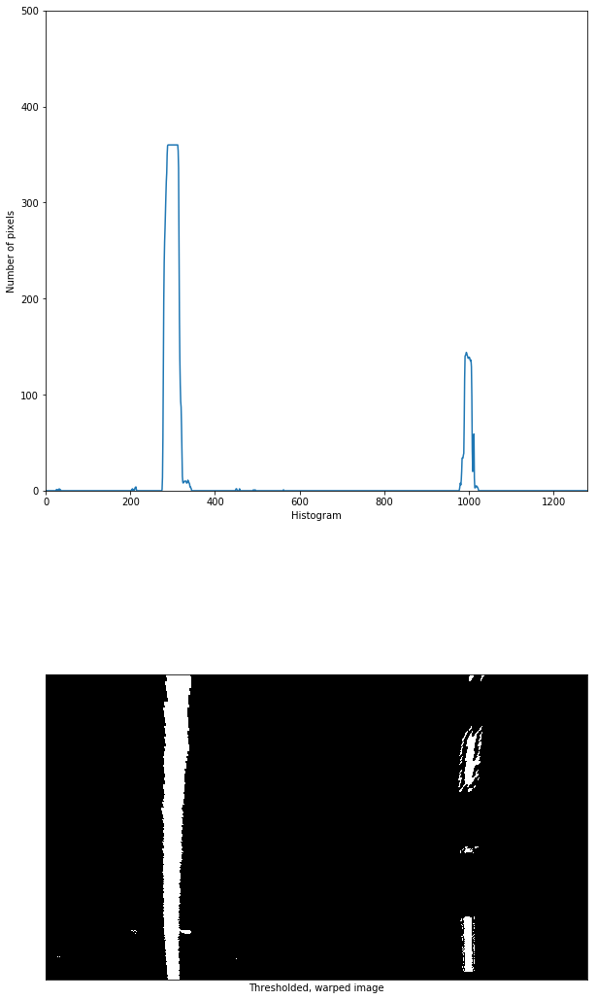

In [11]:
base_pts, hist = find_base_points(lanes)
print(base_pts)

# plt.figure(figsize=(5,3))
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,20))
#ax1.set_axes([0, 0.6, 0.5, 0.5])
ax1.plot(hist)
ax1.set_ylim([0, 500])
ax1.set_xlim([0, 1280])
ax1.set_xlabel('Histogram')
ax1.set_ylabel('Number of pixels')


ax2.imshow(lanes, cmap='gray')
ax2.set_xlabel('Thresholded, warped image')
ax2.set_xticks([],[])
ax2.set_yticks([],[])
#plt.show()

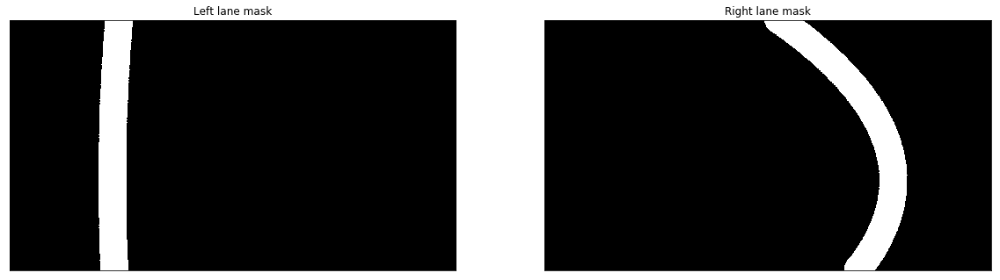

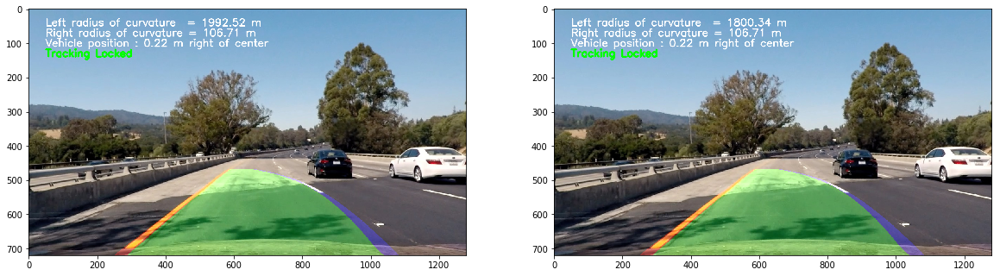

In [12]:
def process_image(image, key_frame_interval=20, memory_length=10, display=False):
    global cam_mtx, cam_dist
    
    if process_image.memory is None:
        
                      
        left_lane = Line(int(0.15*image.shape[0]), image.shape[:2], memory_length=memory_length)
        right_lane = Line(int(0.60*image.shape[0]), image.shape[:2], memory_length=memory_length)

        memory = {'cam_mtx': cam_mtx, 'cam_dist': cam_dist,
                 'warp_m': None, 'warp_minv': None,
                 'frame_ctr': 0, 'left': left_lane,
                 'right': right_lane, 'base_pts': None}
    else:
        memory = process_image.memory
    

    left_lane = memory['left']
    right_lane = memory['right']

    # Preprocess image and find edges using thresholding
    undist = cv2.undistort(image, cam_mtx, cam_dist, None, cam_mtx)
    binary = binary_image_transform(undist)
    
    if memory['warp_m'] is None:
        src = find_perspective_points(undist)
        warp_m, warp_minv = get_perspective_transform(image, src_in = src)
        
        if src is not None:
            # Save only if customized perspective transform is found
            memory['warp_m'] = warp_m
            memory['warp_minv'] = warp_minv
    else:
        warp_m, warp_minv = memory['warp_m'], memory['warp_minv']
    
    warp_edges = cv2.warpPerspective(binary, warp_m, (image.shape[1], image.shape[0]), flags=cv2.INTER_LINEAR)
        
    base_pts = memory['base_pts']
    if base_pts is None: 
        new_base_pts, _ = find_base_points(warp_edges)

        if new_base_pts is not None:
            base_pts = new_base_pts
        else:
            # If could not find new base points re-use previous data 
            memory['frame_ctr'] = memory['frame_ctr'] - 1 
            return undist

    if ((left_lane.current_xfit is None or left_lane.dropped_frames > 14) 
            or (right_lane.current_xfit is None or right_lane.dropped_frames > 14)):
        # Detect from scratch
        left_lane.radius_of_curvature = None
        right_lane.radius_of_curvature = None
        histogram_lane_detection(warp_edges, left_lane, right_lane, base_pts)
    else:
        left_lane.detect_from_mask(warp_edges)
        right_lane.detect_from_mask(warp_edges)

    memory['frame_ctr'] = memory['frame_ctr'] + 1
    memory['base_pts'] = base_pts
    process_image.memory = memory
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)
    
    yvals = left_lane.yvals
    left_fitx = left_lane.current_xfit
    right_fitx = right_lane.current_xfit
    
    # Create an image to draw the lines on
    color_warp = np.zeros_like(image).astype(np.uint8)

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))    

    # Draw lane markers
    pts = np.transpose(np.vstack([left_lane.current_xfit, left_lane.yvals])).reshape((-1,1,2)).astype(np.int32)
    cv2.drawContours(color_warp, pts, -1, (255,0,0), thickness=30)
    pts = np.transpose(np.vstack([right_lane.current_xfit, right_lane.yvals])).reshape((-1,1,2)).astype(np.int32)
    cv2.drawContours(color_warp, pts, -1, (0,0,255), thickness=30)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, warp_minv, (image.shape[1], image.shape[0])) 
    
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    left_r = left_lane.radius_of_curvature
    right_r = right_lane.radius_of_curvature
    middle = (left_fitx[-1] + right_fitx[-1])//2
    veh_pos = image.shape[1]//2
    
    dx = (veh_pos - middle)*xm_per_pix # Positive if on right, Negative on left

    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(result,'Left radius of curvature  = %.2f m'%(left_r),(50,50), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Right radius of curvature = %.2f m'%(right_r),(50,80), font, 1,(255,255,255),2,cv2.LINE_AA)
    cv2.putText(result,'Vehicle position : %.2f m %s of center'%(abs(dx), 'left' if dx < 0 else 'right'),(50,110), 
                        font, 1,(255,255,255),2,cv2.LINE_AA)

    is_tracking = left_lane.detected or right_lane.detected
    cv2.putText(result,'Tracking Locked' if is_tracking else 'Tracking Lost',(50,140),
            font, 1,(0,255,0) if is_tracking else (255,0,0), 3,cv2.LINE_AA)

    if display:
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(left_lane.mask, cmap='gray')
        ax1.set_xticks([],[])
        ax1.set_yticks([],[])
        ax1.set_title('Left lane mask')

        
        ax2.imshow(right_lane.mask, cmap='gray')
        ax2.set_xticks([],[])
        ax2.set_yticks([],[])
        ax2.set_title('Right lane mask')
    
    memory['left'] = left_lane
    memory['right'] = right_lane

    return result

def clear_memory():
    process_image.memory = None
    
process_image.clear_memory = clear_memory
clear_memory()
image = mplimg.imread('test_images/test4.jpg')
out = process_image(image)
out2 = process_image(image,display=True)
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(out)
ax2.imshow(out2)


In [13]:
vid_output = 'project_video_out.mp4'
clip1 = VideoFileClip('project_video.mp4')

In [14]:
clear_memory()
vid_clip = clip1.fl_image(process_image)
%time vid_clip.write_videofile(vid_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [03:35<00:00,  5.85it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 4min 8s, sys: 31 s, total: 4min 39s
Wall time: 3min 36s


In [15]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))

In [16]:
clear_memory()
vid_output = 'challenge_video_out.mp4'
clip2 = VideoFileClip('challenge_video.mp4')
vid_clip = clip2.fl_image(process_image)
%time vid_clip.write_videofile(vid_output, audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [01:10<00:00,  6.84it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

CPU times: user 1min 30s, sys: 6.89 s, total: 1min 37s
Wall time: 1min 11s


In [17]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))

In [18]:
clear_memory()
vid_output = 'harder_challenge_video_out.mp4'
clip2 = VideoFileClip('harder_challenge_video.mp4')
vid_clip = clip2.fl_image(process_image)
%time vid_clip.write_videofile(vid_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [03:44<00:00,  5.34it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

CPU times: user 4min 29s, sys: 27.2 s, total: 4min 56s
Wall time: 3min 46s


In [19]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(vid_output))